In [1]:
import numpy as np
import cv2 
import matplotlib.pyplot as plt
import random 
import plotly.express as px
from skimage import io
from scipy.linalg import rq

# Q1) Direct Linear Transform 

## 1)


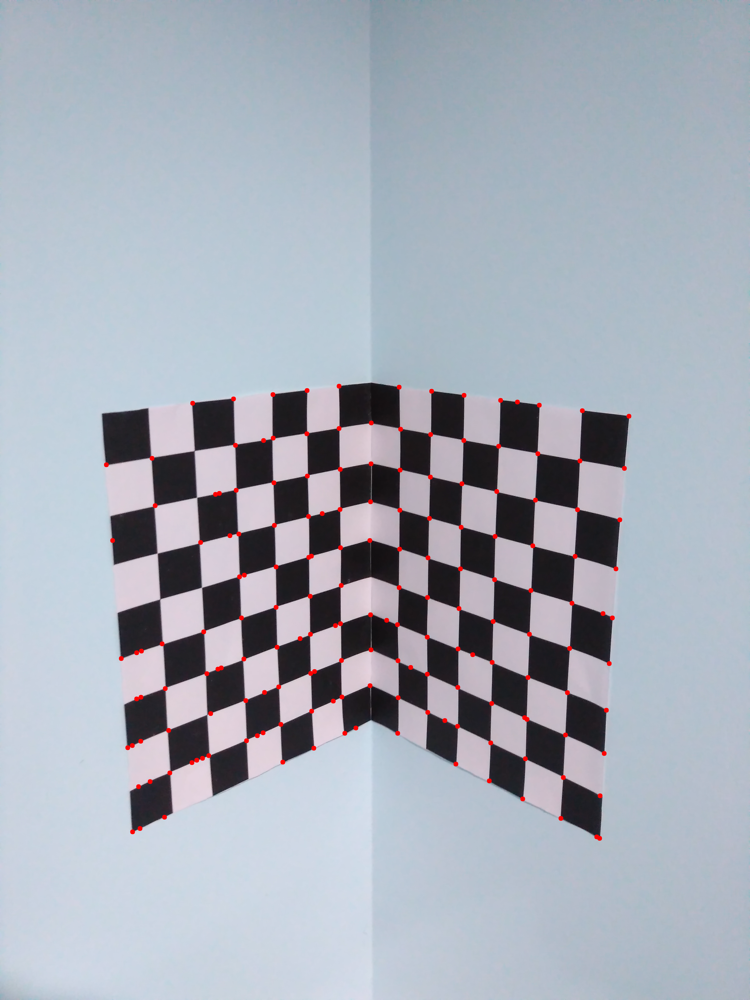

In [2]:
img = cv2.imread('../calibration-data/calib-object.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)

corners = cv2.goodFeaturesToTrack(gray, 170, 0.01, 10)
corners = np.int0(corners)

pts = []
for corner in corners:
    x,y = corner.ravel()
    pts.append( [x,y])
    cv2.circle(img,(x,y),10,255,-1)

fig = px.imshow(img)
fig.show()

#### Read Cordinates 

In [3]:
img_pts = np.array([[1405,1603] ,[1405,1778] ,[1131,2011] ,[1144,2354],[1000,2566],[841,2636] ,[643,2102],[1305,2949],[504,2746],[1015,3077],[829 ,2255] ,[620,1902],[1415,2435] ,[1305, 3124] ,[690 ,3038] ,[1658 ,1612] ,[1784,1807],[1792,1981],[1776,2484],[2065 ,2043],[2178,3151],[2409,1980],[2189,3146],[2519,2942],[2167,3323],[1897,2850],[1661,2899],[2574,2157],[1908,3023],[2167,3321]],dtype='float32')
world_pts = np.array([[0,1,0] ,[0,1,1] ,[0,3,2] ,[0,3,4] ,[0,4,5],[0,5,5] ,[0,6,2],[0,2,8],[0,7,5],[0,4,8] ,[0,5,3] ,[0,6,1] ,[0,1,5] ,[0,2,9],[0,6,7],[1,0,0],[2,0,1],[2,0,2],[2,0,5],[4,0,2],[5,0,8],[6,0,1],[5,0,8],[7,0,6],[5,0,9],[3,0,7],[1,0,8],[7,0,2],[3,0,8],[5,0,9]],dtype='float32')

### Case 1 )
### Original Data Point As input 
### Reconstruction on the original data points

In [4]:
def proj_matrix(img_pts , world_pts):
    
    idx = [0, 5, 13, 20, 23, 28]
    idx = sorted(idx)

    points2d = img_pts[idx]
    points3d = world_pts[idx]
    
    proj_M = []
    
    for i in range( len(points2d) ):
        u,v = points2d[i,0] ,points2d[i,1]
        x,y,z = points3d[i,0] ,points3d[i,1] ,points3d[i,2]
        
        
        row1 = [ x ,y ,z ,1 ,0 ,0 ,0 ,0 ,-u*x ,-u*y ,-u*z ,-u]
        row2 = [ 0 ,0 ,0 ,0 ,x ,y ,z ,1 ,-v*x ,-v*y ,-v*z ,-v]
        
        proj_M.append(row1)
        proj_M.append(row2)
    
    proj_M = np.asarray(proj_M)
    
    u,s,vh =  np.linalg.svd(proj_M )
    
    ans = vh[-1,:]/vh[-1,-1]
    ans = ans.reshape(3,4)
    return ans


def reporjection_error( P , points2d ,points3d ):
    n = len(points2d)
    residual = 0
    recon_points = []
    
    for i in range(n):
        temp = points3d[i]
        temp = np.append( temp , 1)
        
        ans = np.dot(P, temp.T)
        ans = ans / ans[2]
        recon_points.append([ans[0] ,ans[1]])
        residual += np.hypot(ans[0]-points2d[i,0] , ans[1]-points2d[i,1] )
        
    return residual/n ,recon_points

##### i) Scale 28 X 28

In [5]:
world_pts28 = 28*world_pts

p = proj_matrix( img_pts ,world_pts28)
residual,new_points = reporjection_error(p,img_pts ,world_pts28)

print('Projection Matrix')
print(p)

print()
print('Residual : '+str(residual))

Projection Matrix
[[ 2.82089493e+00 -6.37694996e+00  6.65390858e-01  1.53202897e+03]
 [-8.76760265e-01 -1.78592807e+00  6.81585625e+00  1.59333159e+03]
 [-9.98447810e-04 -1.32518859e-03  4.06512557e-04  1.00000000e+00]]

Residual : 14.095532385383823


##### ii) Scale 2800 X 2800

In [6]:
world_pts2800 = 2800*world_pts

p = proj_matrix( img_pts ,world_pts2800)
residual,new_points = reporjection_error(p,img_pts ,world_pts2800)

print('Projection Matrix')
print(p)

print()
print('Residual : '+str(residual))

Projection Matrix
[[ 2.82089459e-02 -6.37694971e-02  6.65390617e-03  1.53202897e+03]
 [-8.76760428e-03 -1.78592755e-02  6.81585573e-02  1.59333158e+03]
 [-9.98447877e-06 -1.32518842e-05  4.06512386e-06  1.00000000e+00]]

Residual : 14.095524981864223


##### Reconstruction 

<ipython-input-7-53644a7aa47e>:7: DeprecationWarning:

an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.



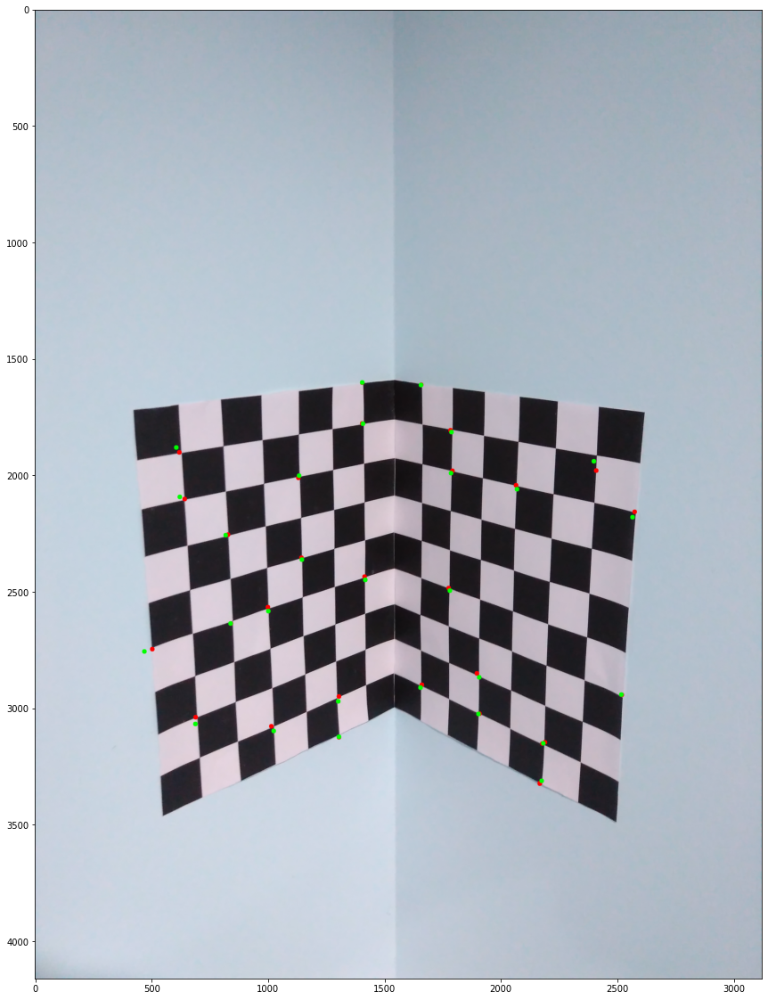

In [7]:
img = cv2.imread('../calibration-data/calib-object.jpg')

for pts in range(len(new_points)):
    orig_pts = img_pts[pts]
    proj_ptsx ,proj_ptsy = int(new_points[pts][0]),int(new_points[pts][1])
    
    cv2.circle(img,tuple(orig_pts),10,255,-1)
    cv2.circle(img,tuple([proj_ptsx,proj_ptsy]) ,10,(0, 255, 0) ,-1)
    
plt.figure(figsize=(20,20))
plt.imshow(img)

### Case 2 )
#### Use normalized data points as input
#### Reconstruction on the normalized data points 
#### Without denormalizing the projection matrix obtained

In [8]:
def find_means(point):
    
    if len(point[0]) == 2:
        x_bar ,y_bar ,d_bar = 0,0,0

        for i in range(len(point)):
            x_bar += point[i][0]
            y_bar += point[i][1]

        x_bar = x_bar/len(point)
        y_bar = y_bar/len(point)

        for i in range(len(point)):
            d_bar += np.hypot( point[i][0]-x_bar , point[i][1]-y_bar)

        d_bar = d_bar/len(point)

        return x_bar ,y_bar ,d_bar
    
    else:
        x_bar ,y_bar , z_bar , d_bar = 0,0,0,0

        for i in range(len(point)):
            x_bar += point[i][0]
            y_bar += point[i][1]
            z_bar += point[i][2]

        x_bar = x_bar/len(point)
        y_bar = y_bar/len(point)
        z_bar = z_bar/len(point)

        for i in range(len(point)):
            d_bar += np.sqrt( (point[i][0]-x_bar)**2 + (point[i][1]-y_bar)**2 + (point[i][2]-z_bar)**2 )

        d_bar = d_bar/len(point)

        return x_bar ,y_bar ,z_bar ,d_bar
    
def normlize_2d(points):
    x_bar ,y_bar ,d_bar = find_means(points)
    root2 = np.sqrt(2)
    
    t = [
        [ root2/d_bar ,     0       , -root2*(x_bar/d_bar) ],
        [       0     , root2/d_bar , -root2*(y_bar/d_bar) ],
        [       0     ,     0       ,           1          ]
    ]
    
    norm_pts = []
    
    for i in points:
        temp = np.append(i,1)
        ans = np.dot(t ,temp.T)
        norm_pts.append( [ans[0],ans[1]] )
    
    return np.asarray(norm_pts) ,t


def normlize_3d(points):
    x_bar ,y_bar ,z_bar ,d_bar = find_means(points)
    root3 = np.sqrt(3)
    
    t = [
        [ root3/d_bar ,     0       ,     0       , -root3*(x_bar/d_bar) ],
        [       0     , root3/d_bar ,     0       , -root3*(y_bar/d_bar) ],
        [       0     ,     0       , root3/d_bar , -root3*(z_bar/d_bar) ],
        [       0     ,     0       ,     0       ,           1          ]
    ]
    
    norm_pts = []
    
    for i in points:
        temp = np.append(i,1)
        ans = np.dot(t ,temp.T)
        norm_pts.append( [ans[0],ans[1] ,ans[2]] )
    
    return np.asarray(norm_pts) ,t

##### i) Scale : 28 X 28

In [9]:
world_pts28 = 28*world_pts

norm_2d,t = normlize_2d(img_pts)
norm_3d,u = normlize_3d(world_pts28)

p = proj_matrix(norm_2d ,norm_3d)
residual,new_points = reporjection_error(p,norm_2d ,norm_3d)

print('Projection Matrix')
print(p)

print()
print('Residual : '+str(residual))

Projection Matrix
[[ 0.61433189 -0.61380187  0.00589638  0.02569695]
 [ 0.22972999  0.21706247  0.8179252   0.03034013]
 [-0.07529404 -0.09968813  0.03097039  1.        ]]

Residual : 0.026334341695260086


##### ii) Scale 2800 X 2800

In [10]:
world_pts28 = 2800*world_pts

norm_2d,t = normlize_2d(img_pts)
norm_3d,u = normlize_3d(world_pts2800)

p = proj_matrix(norm_2d ,norm_3d)
residual,new_points = reporjection_error(p,norm_2d ,norm_3d)

print('Projection Matrix')
print(p)

print()
print('Residual : '+str(residual))

Projection Matrix
[[ 0.61433189 -0.61380187  0.00589638  0.02569695]
 [ 0.22972999  0.21706247  0.8179252   0.03034013]
 [-0.07529404 -0.09968813  0.03097039  1.        ]]

Residual : 0.02633434169526012


### Case 3 )
#### Use normalized data points as input
#### Reconstruction on the original data points
#### With the denormalized projection matrix

##### i) Scale : 28 X 28

In [13]:
world_pts28 = 28*world_pts

norm_2d,t = normlize_2d(img_pts)
norm_3d,u = normlize_3d(world_pts28)

norm_p = proj_matrix(norm_2d ,norm_3d)

inv_t = np.linalg.inv( np.asarray(t))

temp = np.matmul(inv_t ,norm_p)
dnorm_p = np.matmul(temp , u)

residual,new_points = reporjection_error(dnorm_p,img_pts ,world_pts28)

print('Normalized Projection Matrix :')
print(norm_p)
print()

print('Denormlized Projection Matrix :')
print(dnorm_p/dnorm_p[2,3])
print()

print('Residual : ' + str(residual))

Normalized Projection Matrix :
[[ 0.61433189 -0.61380187  0.00589638  0.02569695]
 [ 0.22972999  0.21706247  0.8179252   0.03034013]
 [-0.07529404 -0.09968813  0.03097039  1.        ]]

Denormlized Projection Matrix :
[[ 2.82661962e+00 -6.37608156e+00  6.70695034e-01  1.53217842e+03]
 [-8.74087145e-01 -1.77478302e+00  6.82849824e+00  1.59319792e+03]
 [-9.97217892e-04 -1.32030084e-03  4.10181482e-04  1.00000000e+00]]

Residual : 14.097216818482252


##### ii) Scale : 2800 X 2800

In [12]:
world_pts2800 = 2800*world_pts

norm_2d,t = normlize_2d(img_pts)
norm_3d,u = normlize_3d(world_pts2800)

norm_p = proj_matrix(norm_2d ,norm_3d)

inv_t = np.linalg.inv( np.asarray(t))

temp = np.matmul(inv_t ,norm_p)
dnorm_p = np.matmul(temp , u)

residual,new_points = reporjection_error(dnorm_p,img_pts ,world_pts2800)

print('Normalized Projection Matrix :')
print(norm_p)
print()

print('Denormlized Projection Matrix :')
print(dnorm_p/dnorm_p[2,3])
print()

print('Residual : ' + str(residual))

Normalized Projection Matrix :
[[ 0.61433189 -0.61380187  0.00589638  0.02569695]
 [ 0.22972999  0.21706247  0.8179252   0.03034013]
 [-0.07529404 -0.09968813  0.03097039  1.        ]]

Denormlized Projection Matrix :
[[ 2.82661962e-02 -6.37608156e-02  6.70695034e-03  1.53217842e+03]
 [-8.74087145e-03 -1.77478302e-02  6.82849824e-02  1.59319792e+03]
 [-9.97217892e-06 -1.32030084e-05  4.10181482e-06  1.00000000e+00]]

Residual : 14.097216818482158


#### Observations

1) In Experiment a and c ,Both Projection Matrix and Residual error are almost similar. Residual error differ by only 0.02 between both cases 

2) In case of normlized Point experiment , Residual error are less compare to other two cases which is due to the nomrlization that causes less error 

3) In both of the scale 28 X 28 and 2800 X 2800 , Residual and projection matrix remains same.

## 2) Decomposition of the projection matrix

In [13]:
p = proj_matrix( img_pts ,world_pts28)
residual,new_points = reporjection_error(p,img_pts ,world_pts28)

print('Projection Matrix')
print(p)

print()
print('Residual : '+str(residual))

Projection Matrix
[[ 2.82089493e+00 -6.37694996e+00  6.65390858e-01  1.53202897e+03]
 [-8.76760265e-01 -1.78592807e+00  6.81585625e+00  1.59333159e+03]
 [-9.98447810e-04 -1.32518859e-03  4.06512557e-04  1.00000000e+00]]

Residual : 14.095532385383823


In [14]:
def find_parameters(P):
    
    M = P[0:3,0:3]
    p4 = P[:, 3]

    M_inv = np.linalg.inv(M)
    Q,R = np.linalg.qr(M_inv)
    
    K = np.linalg.inv(R)
    Rot = np.linalg.inv(Q)
    
    t = np.dot( np.linalg.inv(K),p4)
    
    K = K/K[2,2]
    
    return K ,Rot ,t

K , Rot , t = find_parameters(p)

print('Projection Matrix:')
print(p)

print()
print('Camara Calibration Matrix (k):')
print(K)

print()
print('Rotation Matrix (R):')
print(Rot)

print()
print('Translation Matrix (T):')
print(t)

Projection Matrix:
[[ 2.82089493e+00 -6.37694996e+00  6.65390858e-01  1.53202897e+03]
 [-8.76760265e-01 -1.78592807e+00  6.81585625e+00  1.59333159e+03]
 [-9.98447810e-04 -1.32518859e-03  4.06512557e-04  1.00000000e+00]]

Camara Calibration Matrix (k):
[[-3.56433812e+03 -1.21966082e+02  2.02333026e+03]
 [-0.00000000e+00 -3.60971781e+03  2.06040261e+03]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]

Rotation Matrix (R):
[[-0.78851094  0.61218632  0.05897801]
 [-0.1914296  -0.15316615 -0.96948174]
 [-0.58447002 -0.77573709  0.23796377]]

Translation Matrix (T):
[ 78.09559893  75.74370505 585.37864051]


## 3) RANSAC 

#### a) RANSAC based variant of the calibration method

In [15]:
def proj_matrix(points2d , points3d):
    
    proj_M = []
    
    for i in range( len(points2d) ):
        u,v = points2d[i,0] ,points2d[i,1]
        x,y,z = points3d[i,0] ,points3d[i,1] ,points3d[i,2]
        
        
        row1 = [ x ,y ,z ,1 ,0 ,0 ,0 ,0 ,-u*x ,-u*y ,-u*z ,-u]
        row2 = [ 0 ,0 ,0 ,0 ,x ,y ,z ,1 ,-v*x ,-v*y ,-v*z ,-v]
        
        proj_M.append(row1)
        proj_M.append(row2)
    
    proj_M = np.asarray(proj_M)
    
    u,s,vh =  np.linalg.svd(proj_M )
    
    ans = vh[-1,:]/vh[-1,-1]
    ans = ans.reshape(3,4)
    return ans

def RANSAC(img_2d , world_3d , ite = 30): 
    min_residual = 10000
    P = None
    proj_pts = None
    
    temp = np.concatenate((img_2d , world_3d), axis = 1)
    
    for i  in range(ite):
        np.random.shuffle(temp)
        pts_2d  = temp[:6,[0,1]]
        pts_3d  = temp[:6,[2,3,4]]

        P_temp = proj_matrix( pts_2d , pts_3d)
        
        residual,projected_2d_pts = reporjection_error(P_temp,img_2d ,world_3d)

        if residual < min_residual:
            min_residual = residual
            P = P_temp
            proj_pts = projected_2d_pts
            
    return P ,min_residual ,proj_pts


p , res , proj = RANSAC(img_pts ,world_pts28)

print('Projection Matrix P :')
print(p)

print()
print('Residual : ' + str(res) )

Projection Matrix P :
[[ 2.63018594e+00 -6.09118490e+00  5.99756846e-01  1.53021905e+03]
 [-1.01869661e+00 -1.17351595e+00  6.66178891e+00  1.58727422e+03]
 [-1.08992825e-03 -1.12650499e-03  3.91093504e-04  1.00000000e+00]]

Residual : 12.38518640241201


<ipython-input-16-f092addb27a4>:7: DeprecationWarning:

an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.



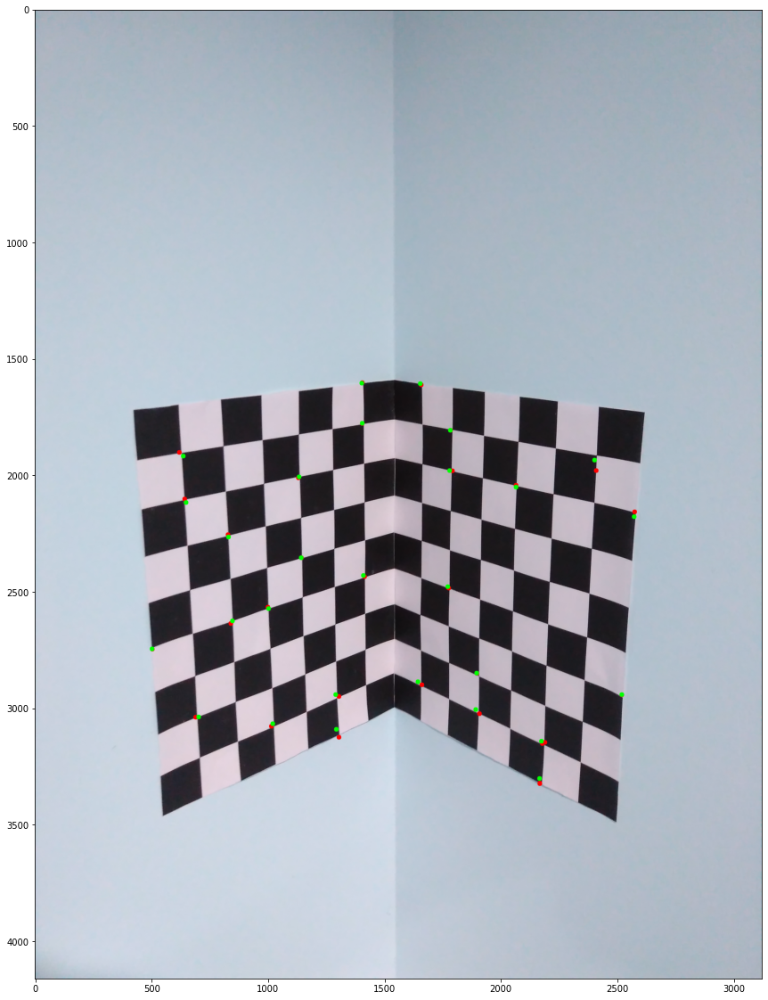

In [16]:
img = cv2.imread('../calibration-data/calib-object.jpg')

for pts in range(len(new_points)):
    orig_pts = img_pts[pts]
    proj_ptsx ,proj_ptsy = int(proj[pts][0]),int(proj[pts][1])
    
    cv2.circle(img,tuple(orig_pts),10,255,-1)
    cv2.circle(img,tuple([proj_ptsx,proj_ptsy]) ,10,(0, 255, 0) ,-1)
    
plt.figure(figsize=(20,20))
plt.imshow(img)

#### Observations

Running the RANSAC With 20 Iterations , There's slight reduction in the Residual error  

### b) 
RANSAC is said to be successful if in atleast 1 of the iterations, it selects only
inliers (correct correspondences) from the input data points. Assume that your
accuracy for annotating the points for the above experiment is 80%. What is
the minimum number of iterations you will have to run RANSAC for getting
probability of success greater than 95%?

<b>Answer</b> <br>
p = Probablity Success of Ransec = 0.95 <br>
e = Probablity of point to be outlier = (1 - 0.8) = 0.2<br>
s = minimum point Required = 6<br>
n = number of iterations<br>

Relation Can be given As :- 
p = 1 - ( 1 - ( 1 - e )^s )^n

n = log( 1-p) / log(1-(1-e)^s)

n = log(0.05) / log(0.7378)

n = 9.85

n = 10 ( Approx )

### c) Assuming the same accuracy, plot a curve of Probability of success RANSEC vs Number of iterations .

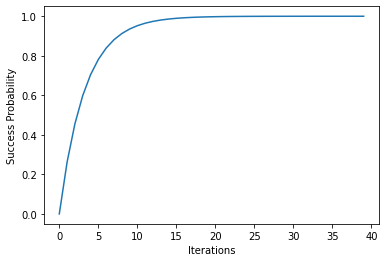

In [17]:
iters = list( range(0,40))

suc_prob = []

for it in iters:
    ans = 1 - (0.737856)**it
    suc_prob.append(ans)
    
plt.plot(iters, suc_prob)
plt.xlabel("Iterations")
plt.ylabel("Success Probability")
plt.show()